In [11]:
import joblib
import pandas as pd
import xgboost
import shap

from src.config import LABEL_COLUMN

shap.initjs() 

In [30]:
data = pd.read_csv('../data/users_test.csv')
x_test = data.drop(columns=LABEL_COLUMN)
y_test = data[LABEL_COLUMN]

In [34]:
pipeline = joblib.load('models/xgb_model_full.joblib')

In [38]:
preprocesor = pipeline['preprocessor']
model = pipeline['model']

In [39]:
observations = preprocesor.transform(x_test)

array([[-0.22383125,  0.00546121,  0.07101245, ...,  0.        ,
         0.        ,  0.        ],
       [ 1.52983273,  2.55705078,  1.34561644, ...,  0.        ,
         0.        ,  0.        ],
       [-0.5376448 , -0.27804874, -0.33149407, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 2.50819264,  0.0763387 ,  0.13809687, ...,  0.        ,
         0.        ,  0.        ],
       [-0.35304859, -0.13629376, -0.33149407, ...,  0.        ,
         0.        ,  0.        ],
       [-0.40842746, -0.02997753, -0.33149407, ...,  0.        ,
         0.        ,  0.        ]])

In [94]:
column_name = (
    preprocesor.transformers_[0][2]
    + list(preprocesor.transformers_[1][1]['onehot'].get_feature_names(preprocesor.transformers[1][2]))
)

observations_df = pd.DataFrame(observations.toarray(), columns=column_name)

In [102]:
observations_df.columns[46]

'country_name_Finland'

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


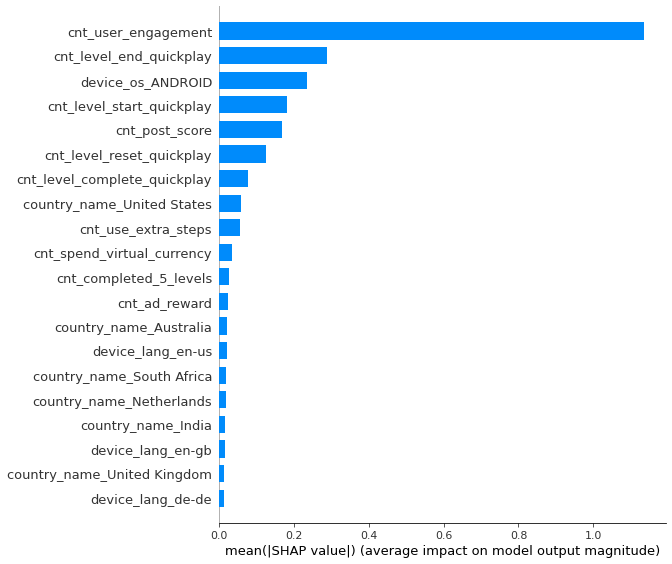

In [96]:
explainer = shap.TreeExplainer(model)

shap_values = explainer.shap_values(observations)

shap.summary_plot(shap_values, observations_df, plot_type="bar")

In [97]:
explainer = shap.Explainer(model)
shap_values = explainer(observations_df)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


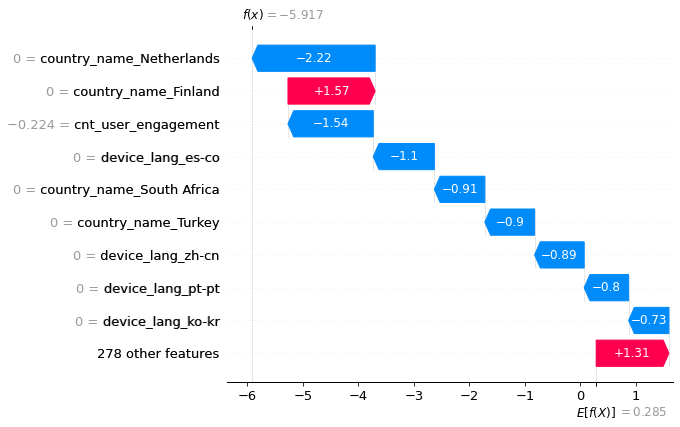

In [98]:
# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[0])

In [99]:
explainer.expected_value

0.28523943

In [100]:
shap.plots.force(shap_values[0])

In [101]:
shap.plots.force(explainer.expected_value, shap_values.values)